# Analisis para Colombia

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from datetime import date
from datetime import datetime
import matplotlib.pyplot as plt
from adjustText import adjust_text
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter, FixedLocator, MultipleLocator
import locale
plt.style.use('Solarize_Light2')
locale.setlocale(locale.LC_TIME, 'es_ES.UTF-8');

## Dataset
## INS - Instituro Nacional de Salud

In [2]:
# CARGAMOS EL DATASET DE COVID-19 COLOMBIA Y LA LISTA CON MUNICIPIOS PDET
url = 'https://www.datos.gov.co/api/views/gt2j-8ykr/rows.csv?accessType=DOWNLOAD'
url2 = 'http://saludata.saludcapital.gov.co/osb/datos_abiertos_osb/enf-transmisibles/OSB_EnfTransm-COVID-19.csv'
pdet = pd.read_csv('data/MunicipiosPDET.csv')
censo = pd.read_csv('data/censo_municipal2018.csv')
datos = pd.read_csv(url)
bog = pd.read_csv(url2,encoding='iso-8859-1', sep=';', skiprows=4,skipfooter=2, parse_dates=['Fecha de diagnóstico'], dayfirst=True)

## Variables de interes
### CASOS
1. fecha de reporte web
### MUERTES
2. Fecha de muerte

In [3]:
datos['Fecha de muerte'] = pd.to_datetime(datos['Fecha de muerte'])
datos['fecha reporte web'] = pd.to_datetime(datos['fecha reporte web'])
bog['Fecha de diagnóstico'] = pd.to_datetime(bog['Fecha de diagnóstico'])

In [4]:
muertes = datos.groupby(['Fecha de muerte','Ciudad de ubicación'])['ID de caso'].count().unstack().fillna(0)
muertes_acumuladas = muertes.cumsum()

casos = datos.groupby(['fecha reporte web','Ciudad de ubicación'])['ID de caso'].count().unstack().fillna(0)
casos_acumulados = casos.cumsum()

bog_casos = bog.groupby(['Fecha de diagnóstico','Localidad de residencia'])['ID de caso'].count().unstack().fillna(0)
bog_casos_acu = bog_casos.cumsum()

pdet_1 = datos[datos['Código DIVIPOLA'].isin(pdet['CodigoMunicipio'])]
pdet_1 = pdet_1.merge(pdet, how='left', left_on = 'Código DIVIPOLA', right_on='CodigoMunicipio')
pdet_casos = pdet_1.groupby(['fecha reporte web','NombreSubregion'])['ID de caso'].count().unstack().fillna(0)
pdet_casos_acumulados = pdet_casos.cumsum()

pdet_muertes = pdet_1.groupby(['Fecha de muerte','NombreSubregion'])['ID de caso'].count().unstack().fillna(0)
pdet_muertes_acumuladas = pdet_muertes.cumsum()

pdet_casos.tail()

NombreSubregion,ALTO PATÍA Y NORTE DEL CAUCA,ARAUCA,BAJO CAUCA Y NORDESTE ANTIOQUEÑO,CATATUMBO,CHOCÓ,CUENCA DEL CAGUÁN Y PIEDEMONTE CAQUETEÑO,MACARENA GUAVIARE,MONTES DE MARÍA,PACÍFICO MEDIO,PACÍFICO Y FRONTERA NARIÑENSE,PUTUMAYO,SIERRA NEVADA-PERIJÁ-ZONA BANANERA,SUR DE BOLÍVAR,SUR DE CÓRDOBA,SUR DEL TOLIMA,URABÁ ANTIOQUEÑO
fecha reporte web,,,,,,,,,,,,,,,,
2020-06-29,5.0,0.0,2.0,0.0,4.0,0.0,0.0,10.0,1.0,43.0,3.0,58.0,1.0,6.0,0.0,23.0
2020-06-30,11.0,0.0,37.0,2.0,11.0,0.0,0.0,0.0,36.0,32.0,2.0,78.0,0.0,0.0,0.0,2.0
2020-07-01,11.0,3.0,13.0,0.0,2.0,4.0,2.0,12.0,58.0,23.0,0.0,81.0,0.0,1.0,0.0,17.0
2020-07-02,20.0,1.0,39.0,1.0,6.0,4.0,0.0,10.0,52.0,14.0,1.0,80.0,2.0,9.0,0.0,16.0
2020-07-03,8.0,0.0,10.0,0.0,9.0,0.0,0.0,4.0,12.0,15.0,4.0,72.0,0.0,1.0,1.0,69.0


In [5]:
#pdet_casos_acumulados.columns =  pdet_casos_acumulados.tail(7).mean().sort_values(ascending=False).index
pdet_casos_acumulados.reset_index(drop=True).columns

Index(['ALTO PATÍA Y NORTE DEL CAUCA', 'ARAUCA',
       'BAJO CAUCA Y NORDESTE ANTIOQUEÑO', 'CATATUMBO', 'CHOCÓ',
       'CUENCA DEL CAGUÁN Y PIEDEMONTE CAQUETEÑO', 'MACARENA GUAVIARE',
       'MONTES DE MARÍA', 'PACÍFICO MEDIO', 'PACÍFICO Y FRONTERA NARIÑENSE',
       'PUTUMAYO', 'SIERRA NEVADA-PERIJÁ-ZONA BANANERA', 'SUR DE BOLÍVAR',
       'SUR DE CÓRDOBA', 'SUR DEL TOLIMA', 'URABÁ ANTIOQUEÑO'],
      dtype='object', name='NombreSubregion')

Organizemos el dataframe por orden de cantidad de casos o muertes

In [6]:
def rollingCases(df, cases, cantidad):
    df_append = pd.DataFrame()
    df = df.rolling(7, min_periods=1, win_type='gaussian').mean(std=2)
    df.reset_index(drop=True, inplace=True)
    df =  df.reindex( columns=df.tail(7).mean().sort_values(ascending=False).index)
    print(df.columns[:cantidad])
    #df = df.sort_values(axis=1, by=df.index[-7:-1].mean(), ascending=False).reset_index(drop=True)
    for ciudad in range(cantidad):
        df_temp = pd.DataFrame()
        # Se toma el indice desde que los casos superan X cantidad
        first_value = df[ df.iloc[:,ciudad] >= cases ].iloc[:,ciudad].head(1)
        print(first_value)
        if not first_value.empty:
            print(first_value.index[0])
            idx = first_value.index[0]
            df_temp['datos'] = df.iloc[idx:,ciudad]
            df_temp['ciudad'] = df.columns[ciudad]
            df_temp.reset_index(inplace=True)
            df_append = pd.concat([df_append, df_temp])
    return df_append


In [7]:
sns.set()
def graficar(df,titulo,xlabel,ylabel,texto):
    text = []
    ciudades = df['ciudad'].unique()
    #plt.style.use('fivethirtyeight')
    #plt.style.use('ggplot')
    plt.style.use('Solarize_Light2')
    plt.figure(figsize=(16,9), dpi=500)
    plt.margins(0.005,0.05)
    for ciudad in ciudades:
        if not ciudad == 'Sin Dato':
            y = df[df['ciudad']==ciudad]['datos']
            fig = sns.lineplot(x = y.index, y = y, data = df, legend=False)  
            if ciudad == 'Bogotá D.C.':
                ciudad = 'Bogotá'
            elif ciudad == 'San Andrés de Tumaco':
                ciudad = 'Tumaco'
            elif ciudad == 'Cartagena de Indias':
                ciudad = 'Cartagena'
            size = 16
            fig.annotate(ciudad, 
                xy=(y.index[-1], y.iloc[-1]), 
                xytext=(5,1), 
                color= plt.gca().lines[-1].get_color() ,  
                textcoords="offset points",
                size=size, va="center",weight='bold')
        #adjust_text(text)   
    ax = plt.gca()
    ax.set_yscale('log')
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
    ax.yaxis.set_major_locator(FixedLocator([1,3,5,10,30,50,100,300,500,1000,3000,5000,10000,30000,50000,100000,300000,500000,1000000]))
    ax.xaxis.set_major_locator(MultipleLocator(10))
    plt.xlabel(xlabel, fontsize=18, weight='bold')
    plt.ylabel(ylabel, fontsize=16, weight='bold')
    plt.title(titulo, fontsize=18, weight='bold')
    plt.gcf().text(0.55, 0.15, texto, fontsize=10)
    plt.savefig(f'images_COL/{titulo}{fecha}.png', facecolor='w', bbox_inches='tight')
    plt.show()

In [27]:
num_casos_acu = 100
num_casos_diarios = 30

num_muertes_acu = 10
num_muertes_diarias = 3

can_casos_acu = 5
can_muertes_acu = 5
can_casos_diarios = 5
can_muertes_diarias = 5

pdet_num_casos_acu = 30
pdet_num_muertes_acu = 10
pdet_num_casos_diarios = 10
pdet_num_muertes_diarias = 3

localidades = 10
dep_pdet = 10

In [28]:
fecha = date.today()
fecha_cool = datetime.strftime(fecha,'%B %d')
fecha = str(fecha)
texto_col = f'Instituto Nacional de Salud - @JairoTorregrose - {fecha_cool}'
texto_bog = f'SALUDATA - @JairoTorregrose - {fecha_cool}'

In [29]:
titulo_casos_acumulados = f'TOP {can_casos_acu} ciudades en Colombia con Casos Acumulados'
xlabel_casos_acumulados = f'Número de días desde los primeros {num_casos_acu} casos'
ylabel_casos_acumulados = 'Casos acumulados'

titulo_casos_diarios = f'TOP {can_casos_diarios} ciudades en Colombia con Casos Diarios'
xlabel_casos_diarios = f'Número de días desde los primeros {num_casos_diarios} casos diarios'
ylabel_casos_diarios = 'Casos diarios'

titulo_muertes_acumuladas = f'TOP {can_muertes_acu} ciudades en Colombia con Muertes Acumuladas'
xlabel_muertes_acumuladas = f'Número de días desde las primeras {num_muertes_acu} muertes'
ylabel_muertes_acumuladas = 'Muertes acumuladas'

titulo_muertes_diarias = f'TOP {can_muertes_diarias} ciudades en Colombia con Muertes Diarias'
xlabel_muertes_diarias = f'Número de días desde las primeras {num_muertes_diarias} muertes diarias'
ylabel_muertes_diarias = 'Muertes diarias'

In [30]:
titulo_diarios = f'TOP {localidades} localidades en Bogotá con Casos Diarios'
xlabel_diarios = f'Número de días desde los primeros {num_casos_diarios} casos diarios'
ylabel_diarios = 'Casos diarios'

titulo_acu = f'TOP {localidades} localidades en Bogotá con Casos Acumulados'
xlabel_acu = f'Número de días desde los primeros {num_casos_acu} casos'
ylabel_acu = 'Casos acumulados'

In [31]:
titulo_muertes_acumuladas_pdet = f'TOP {dep_pdet} ciudades en Colombia con Muertes Acumuladas'
xlabel_muertes_acumuladas_pdet = f'Número de días desde las primeras {pdet_num_muertes_acu} muertes'
ylabel_muertes_acumuladas_pdet = 'Muertes acumuladas'

titulo_casos_acumulados_pdet = f'TOP {dep_pdet} ciudades en Colombia con Casos Acumulados'
xlabel_casos_acumulados_pdet = f'Número de días desde los primeros {pdet_num_casos_acu} casos'
ylabel_casos_acumulados_pdet = 'Casos acumulados'

titulo_casos_diarios_pdet = f'TOP {dep_pdet} ciudades en Colombia con Casos Diarios'
xlabel_casos_diarios_pdet = f'Número de días desde los primeros {pdet_num_casos_diarios} casos diarios'
ylabel_casos_diarios_pdet = 'Casos diarios'


In [32]:
casos_acumulados.tail()

Ciudad de ubicación,Acacías,Acandí,Acevedo,Achí,Agrado,Agua de Dios,Aguachica,Aguadas,Aguazul,Agustín Codazzi,...,Yopal,Yotoco,Yumbo,Zambrano,Zaragoza,Zarzal,Zipacón,Zipaquirá,Zona Bananera,Ábrego
fecha reporte web,,,,,,,,,,,,,,,,,,,,,
2020-06-29,32.0,1.0,3.0,0.0,2.0,4.0,36.0,1.0,5.0,80.0,...,48.0,6.0,132.0,1.0,0.0,2.0,4.0,134.0,21.0,1.0
2020-06-30,32.0,1.0,3.0,0.0,2.0,4.0,37.0,1.0,5.0,83.0,...,48.0,6.0,136.0,1.0,0.0,2.0,4.0,139.0,21.0,1.0
2020-07-01,32.0,1.0,3.0,1.0,2.0,4.0,38.0,1.0,5.0,92.0,...,49.0,6.0,140.0,2.0,0.0,2.0,4.0,142.0,21.0,1.0
2020-07-02,33.0,1.0,3.0,1.0,2.0,4.0,38.0,1.0,5.0,92.0,...,50.0,8.0,144.0,2.0,1.0,5.0,4.0,151.0,23.0,1.0
2020-07-03,33.0,1.0,3.0,2.0,2.0,4.0,41.0,1.0,5.0,95.0,...,52.0,9.0,146.0,2.0,1.0,7.0,4.0,158.0,23.0,1.0


In [33]:
df_casos_acum = rollingCases(casos_acumulados, cases=num_casos_acu, cantidad=can_casos_acu)
df_muertes_acum = rollingCases(muertes_acumuladas, cases=num_muertes_acu, cantidad=can_muertes_acu)

df_casos_diarios = rollingCases(casos, cases=num_casos_diarios, cantidad=can_casos_diarios)
df_muertes_diarias = rollingCases(muertes, cases=num_muertes_diarias, cantidad=can_muertes_diarias)

df_bog_casos = rollingCases(bog_casos, cases=num_casos_diarios, cantidad=localidades)
df_bog_casos_acu = rollingCases(bog_casos_acu, cases=num_casos_acu, cantidad=localidades)

df_casos_acum_pdet = rollingCases(pdet_casos_acumulados, cases=pdet_num_casos_acu, cantidad=dep_pdet)
df_muertes_acum_pdet = rollingCases(pdet_muertes_acumuladas, cases=pdet_num_muertes_acu, cantidad=dep_pdet)

df_casos_diarios_pdet = rollingCases(pdet_casos, cases=pdet_num_casos_diarios, cantidad=dep_pdet)


Index(['Bogotá D.C.', 'Barranquilla', 'Cartagena de Indias', 'Cali',
       'Soledad'],
      dtype='object', name='Ciudad de ubicación')
16    104.131036
Name: Bogotá D.C., dtype: float64
16
50    104.066895
Name: Barranquilla, dtype: float64
50
36    104.721892
Name: Cartagena de Indias, dtype: float64
36
27    106.851106
Name: Cali, dtype: float64
27
55    112.922201
Name: Soledad, dtype: float64
55
Index(['Barranquilla', 'Bogotá D.C.', 'Cartagena de Indias', 'Soledad',
       'Cali'],
      dtype='object', name='Ciudad de ubicación')
43    11.542787
Name: Barranquilla, dtype: float64
43
13    10.422234
Name: Bogotá D.C., dtype: float64
13
26    10.476978
Name: Cartagena de Indias, dtype: float64
26
46    10.406819
Name: Soledad, dtype: float64
46
23    10.673862
Name: Cali, dtype: float64
23
Index(['Bogotá D.C.', 'Barranquilla', 'Soledad', 'Cartagena de Indias',
       'Cali'],
      dtype='object', name='Ciudad de ubicación')
22    33.667882
Name: Bogotá D.C., dtype: float64
22
65

In [34]:
df_casos_acum.head()

,index,datos,ciudad
0,16,104.131036,Bogotá D.C.
1,17,123.856025,Bogotá D.C.
2,18,145.375695,Bogotá D.C.
3,19,169.284102,Bogotá D.C.
4,20,195.418704,Bogotá D.C.


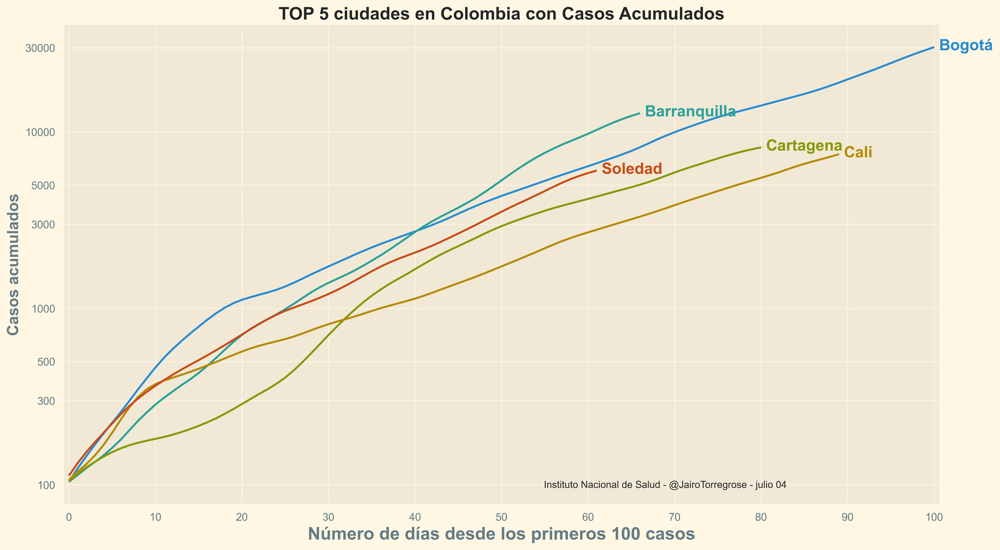

In [35]:
graficar(df_casos_acum, titulo_casos_acumulados,xlabel_casos_acumulados,ylabel_casos_acumulados ,texto_col)

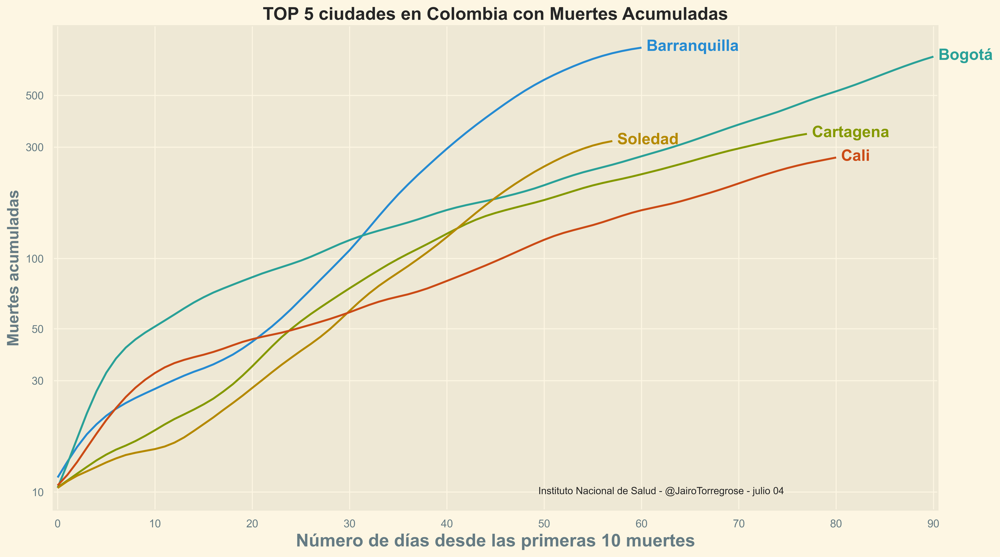

In [36]:
graficar(df_muertes_acum, titulo_muertes_acumuladas,xlabel_muertes_acumuladas,ylabel_muertes_acumuladas,texto_col)

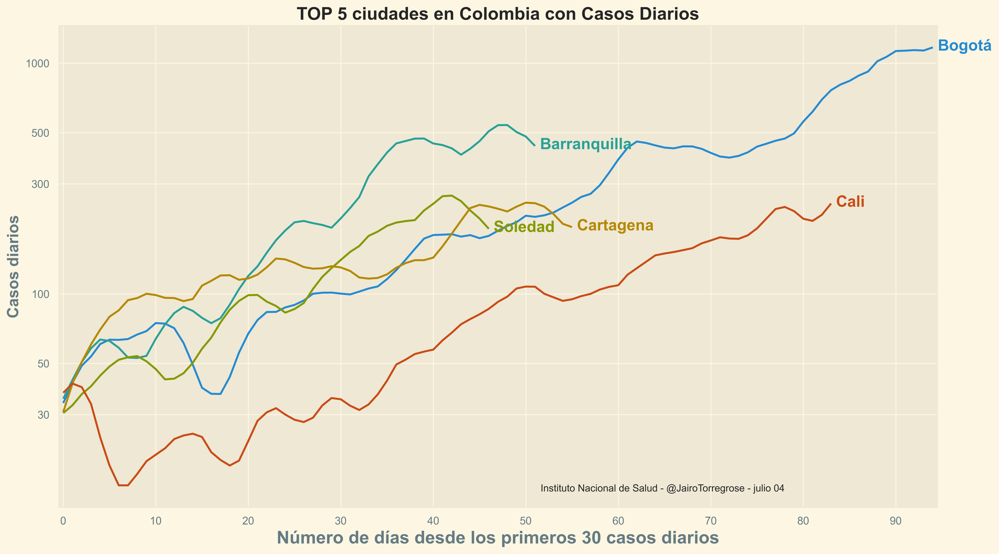

In [37]:
graficar(df_casos_diarios, titulo_casos_diarios, xlabel_casos_diarios, ylabel_casos_diarios,texto_col)

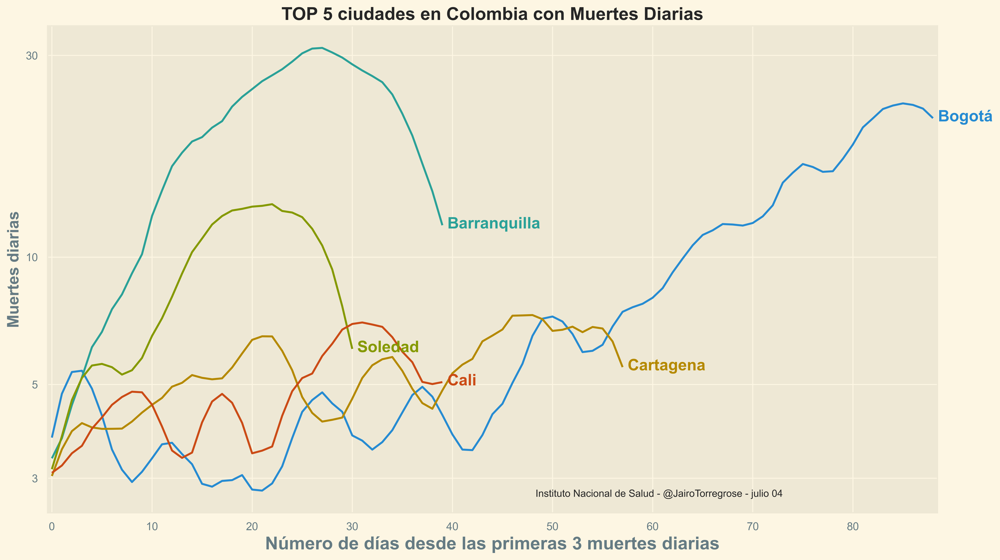

In [38]:
graficar(df_muertes_diarias, titulo_muertes_diarias, xlabel_muertes_diarias, ylabel_muertes_diarias,texto_col)

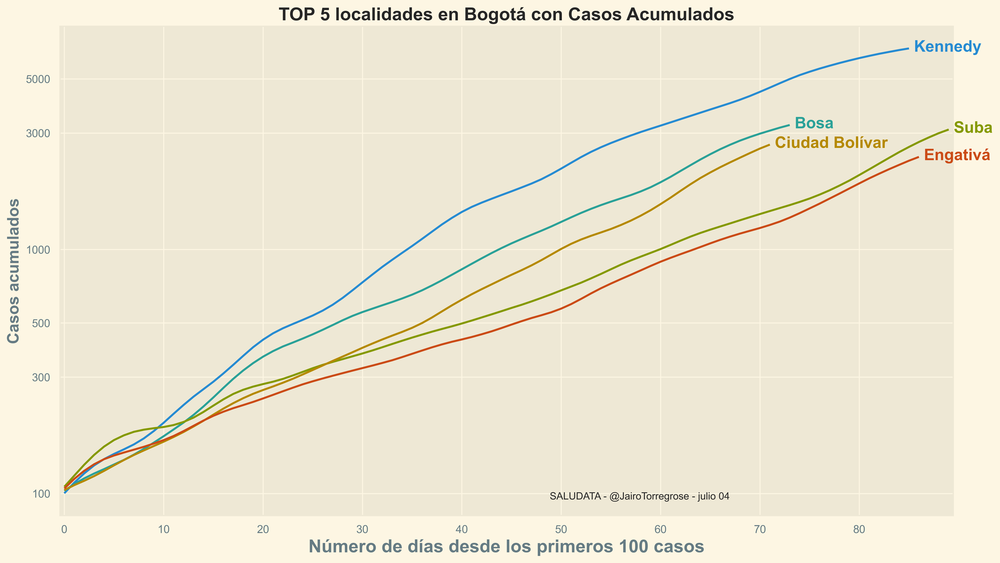

In [39]:
graficar(df_bog_casos_acu, titulo_acu, xlabel_acu, ylabel_acu ,texto_bog)

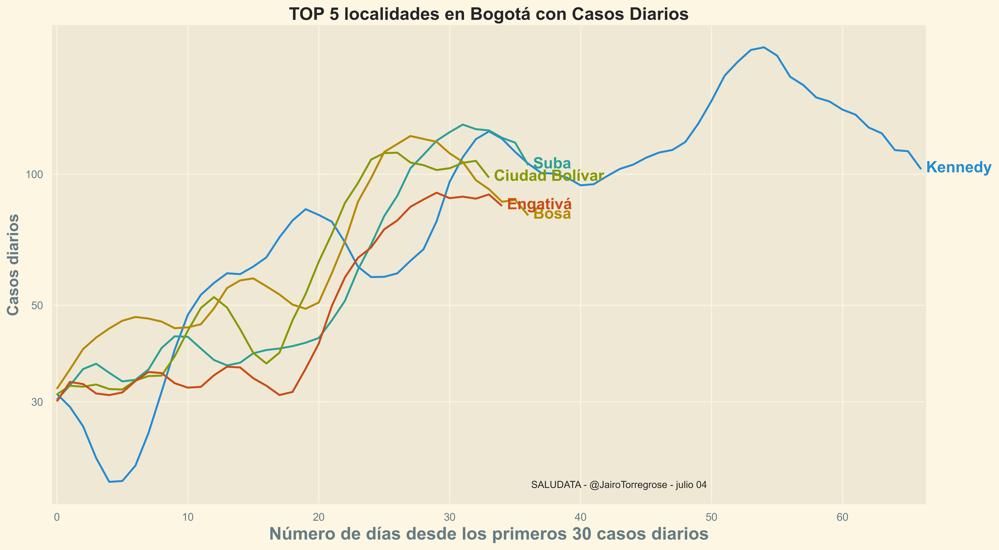

In [40]:
graficar(df_bog_casos, titulo_diarios, xlabel_diarios, ylabel_diarios , texto_bog)

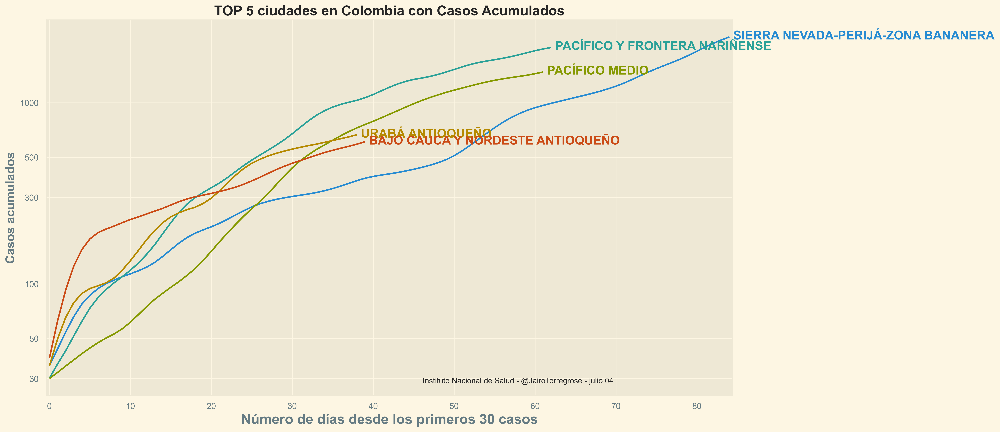

In [41]:
graficar(df_casos_acum_pdet, titulo_casos_acumulados_pdet,xlabel_casos_acumulados_pdet, ylabel_casos_acumulados_pdet,texto_col)

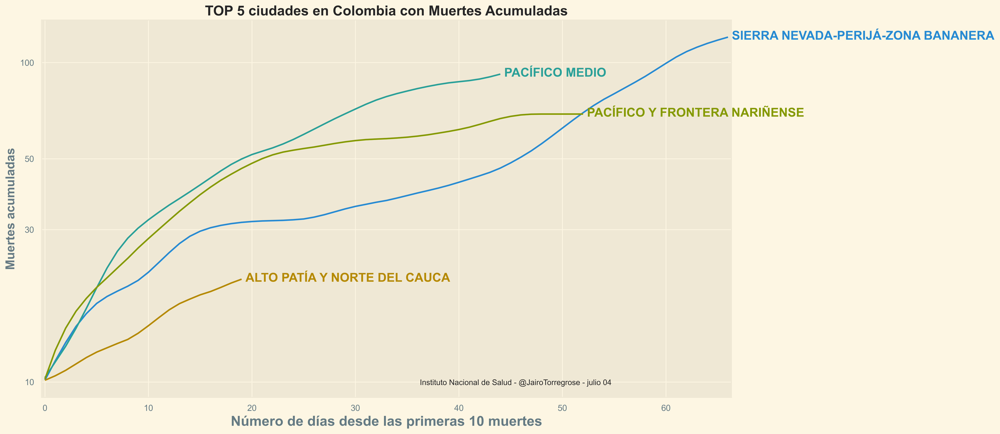

In [42]:
graficar(df_muertes_acum_pdet,titulo_muertes_acumuladas_pdet,xlabel_muertes_acumuladas_pdet,ylabel_muertes_acumuladas_pdet,texto_col)

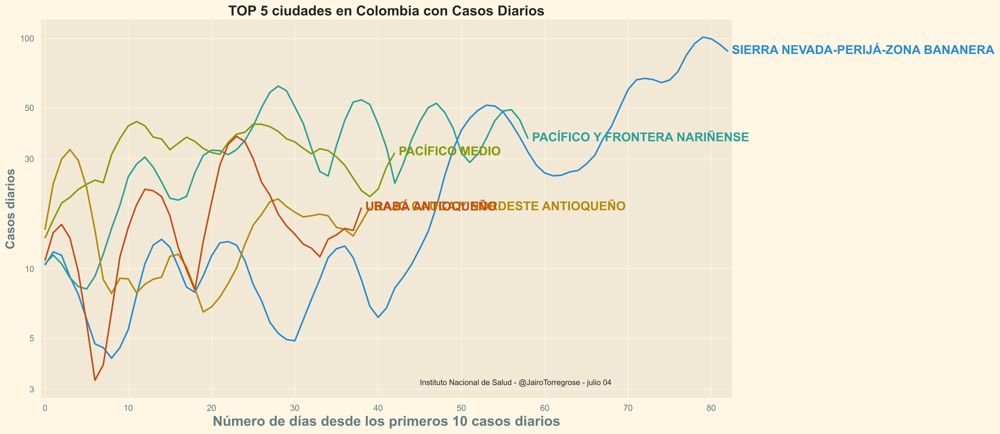

In [43]:
graficar(df_casos_diarios_pdet,titulo_casos_diarios_pdet,xlabel_casos_diarios_pdet,ylabel_casos_diarios_pdet,texto_col)